In [1]:
!pip install geopandas


In [4]:
!pip install contextily

In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
# Reading a GeoPackage file
input_file = "kontur_historical_population_density_for_2020_IN_20230621.gpkg"
data = gpd.read_file(input_file)

In [2]:
import contextily as cx

In [3]:
data.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [252]:
df = data.to_crs(epsg=4326)
print(df.crs)
df.head()

EPSG:4326
                h3  population  \
0  8864e6ceddfffff         189   
1  8864e6ced9fffff          50   
2  8864e6ced1fffff           4   
3  8864e6cecbfffff         666   
4  8864e6cec3fffff         133   

                                            geometry  
0  POLYGON ((93.04213 13.23463, 93.04248 13.23986...  
1  POLYGON ((93.03695 13.22707, 93.03730 13.23230...  
2  POLYGON ((93.03283 13.23520, 93.03318 13.24042...  
3  POLYGON ((93.05143 13.23406, 93.05179 13.23929...  
4  POLYGON ((93.04731 13.24219, 93.04766 13.24742...  


In [260]:
df.head()

,h3,population,geometry
0,8864e6ceddfffff,189,"POLYGON ((93.04213 13.23463, 93.04248 13.23986..."
1,8864e6ced9fffff,50,"POLYGON ((93.03695 13.22707, 93.03730 13.23230..."
2,8864e6ced1fffff,4,"POLYGON ((93.03283 13.23520, 93.03318 13.24042..."
3,8864e6cecbfffff,666,"POLYGON ((93.05143 13.23406, 93.05179 13.23929..."
4,8864e6cec3fffff,133,"POLYGON ((93.04731 13.24219, 93.04766 13.24742..."


<AxesSubplot:>

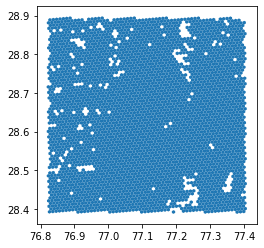

In [5]:
DELHI_MIN_LAT = 28.3968
DELHI_MAX_LAT = 28.8886 
DELHI_MIN_LONG = 77.397574
DELHI_MAX_LONG = 76.8281 

# Filter data for the region near Delhi
delhi_region = data.cx[DELHI_MIN_LONG:DELHI_MAX_LONG, DELHI_MIN_LAT:DELHI_MAX_LAT]

delhi_region.plot()


In [6]:
df_wm = delhi_region.to_crs(epsg = 3857)

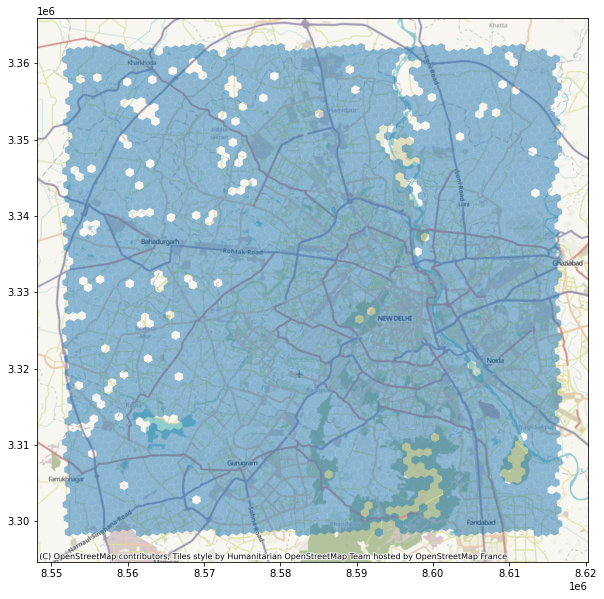

In [7]:
ax = df_wm.plot(figsize=(10, 10), alpha=0.5)
cx.add_basemap(ax)

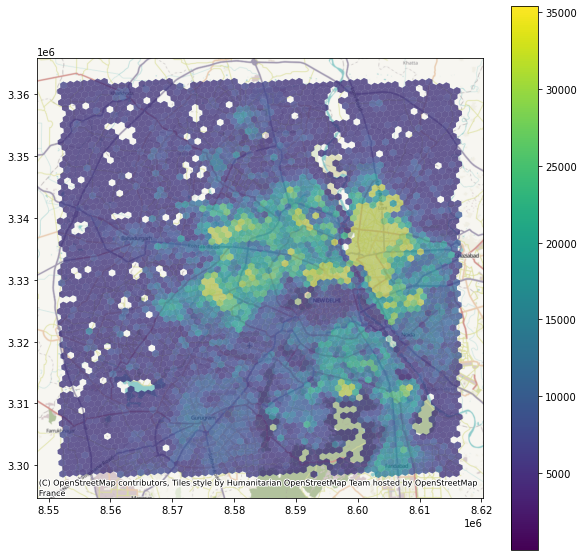

In [8]:
ax = df_wm.plot(figsize=(10, 10), alpha=0.5)
df_wm.plot(column='population', cmap='viridis', legend=True,alpha=0.5, ax=ax)

# Adding a basemap
cx.add_basemap(ax)

# Display the plot
plt.show()

In [9]:
import networkx as nx

In [10]:
delhi_region.head()

,h3,population,geometry
1534419,883da1d4bbfffff,37,"POLYGON ((76.82911 28.58913, 76.82953 28.58438..."
1534420,883da1d4b9fffff,257,"POLYGON ((76.81928 28.58836, 76.81970 28.58361..."
1534421,883da1d4b7fffff,121,"POLYGON ((76.83036 28.57487, 76.83077 28.57012..."
1534422,883da1d4b5fffff,165,"POLYGON ((76.82053 28.57410, 76.82094 28.56935..."
1534423,883da1d4b3fffff,22,"POLYGON ((76.83465 28.58238, 76.83506 28.57763..."


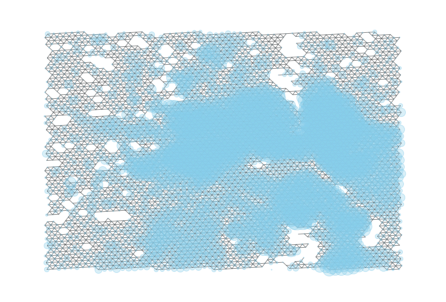

In [206]:
G = nx.Graph()

# Add nodes with hexagon centroids as positions
for index, row in delhi_region.iterrows():
    G.add_node(index, pos=row['geometry'].centroid.coords[0])

# Add edges based on spatial adjacency
for i, hex1 in delhi_region.iterrows():
    for j, hex2 in delhi_region.iterrows():
        if i != j and hex1['geometry'].touches(hex2['geometry']):
            G.add_edge(i, j)

# Draw the graph with node sizes based on population
node_sizes = delhi_region['population'] * 0.01
pos = nx.get_node_attributes(G, 'pos')
nx.draw(G, pos, with_labels=False, node_size=node_sizes, node_color='skyblue', alpha=0.3)
plt.show()

In [207]:
max_neighbors_node = max(G.degree, key=lambda x: x[1])

print(f"The node with maximum neighbors is {max_neighbors_node[0]} with {max_neighbors_node[1]} neighbors.")

The node with maximum neighbors is 1534419 with 6 neighbors.


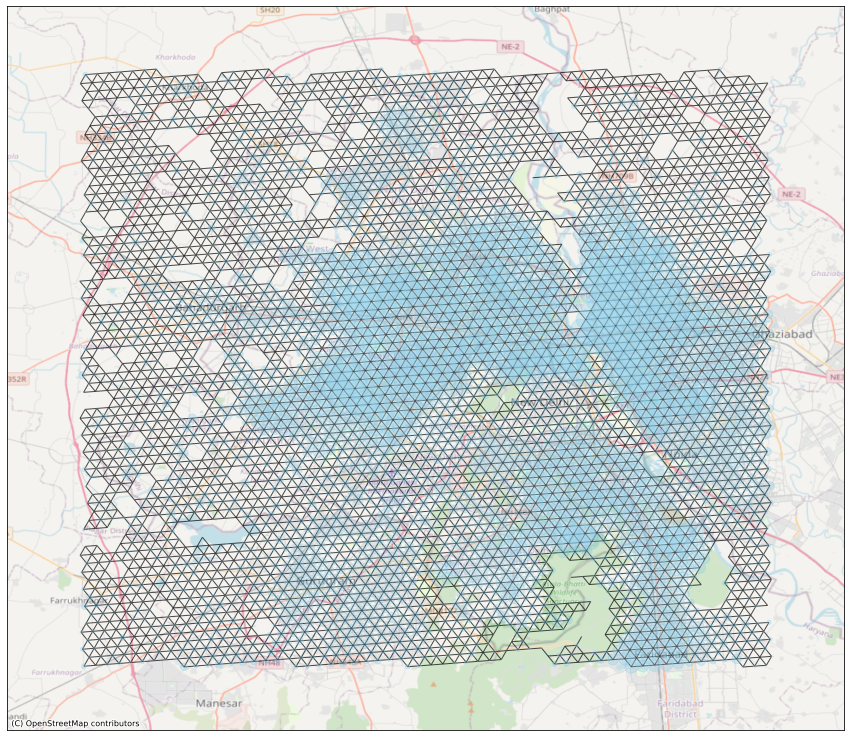

In [17]:
node_sizes = delhi_region['population'] * 0.01
pos = nx.get_node_attributes(G, 'pos')

# Increase the figure size
fig, ax = plt.subplots(figsize=(15, 15))

nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='skyblue', alpha=0.3)
nx.draw_networkx_edges(G, pos, alpha=0.7)

# Plot the Delhi map with basemap
cx.add_basemap(ax, crs=delhi_region.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik, alpha=0.7)

plt.show()

In [18]:
G.size()

11002

In [19]:
import random
from shapely.geometry import Point
from geopy.distance import geodesic

In [20]:
random_node = 1534419
#to calculate distance between nieghbours of the graph
# Print the neighbors of the random node
neighbors = list(G.neighbors(random_node))
print(f"Neighbors of node {random_node}: {neighbors}")

# Calculate distances between neighbors and their neighbors
distances = {}
for neighbor in neighbors:
    point1 = Point(delhi_region.at[random_node, 'geometry'].centroid.coords[0])
    point2 = Point(delhi_region.at[neighbor, 'geometry'].centroid.coords[0])
    distances[neighbor] = geodesic((point1.y, point1.x), (point2.y, point2.x)).km

    # Get neighbors of the current neighbor
    second_neighbors = list(G.neighbors(neighbor))

    # Calculate distances to second neighbors
    for second_neighbor in second_neighbors:
        point3 = Point(delhi_region.at[neighbor, 'geometry'].centroid.coords[0])
        point4 = Point(delhi_region.at[second_neighbor, 'geometry'].centroid.coords[0])
        distances[(neighbor, second_neighbor)] = geodesic((point3.y, point3.x), (point4.y, point4.x)).km

print("Distances:")
for node, distance in distances.items():
    print(f"Node {random_node} to Node {node}: {distance:.2f} km")

Neighbors of node 1534419: [1534420, 1534423, 1534424, 1534435, 1534436, 1539673]
Distances:
Node 1534419 to Node 1534420: 0.97 km
Node 1534419 to Node (1534420, 1534419): 0.97 km
Node 1534419 to Node (1534420, 1534424): 0.92 km
Node 1534419 to Node (1534420, 1534436): 0.93 km
Node 1534419 to Node 1534423: 0.92 km
Node 1534419 to Node (1534423, 1534419): 0.92 km
Node 1534419 to Node (1534423, 1534421): 0.93 km
Node 1534419 to Node (1534423, 1534424): 0.97 km
Node 1534419 to Node (1534423, 1535579): 0.92 km
Node 1534419 to Node (1534423, 1539673): 0.93 km
Node 1534419 to Node (1534423, 1539677): 0.97 km
Node 1534419 to Node 1534424: 0.93 km
Node 1534419 to Node (1534424, 1534419): 0.93 km
Node 1534419 to Node (1534424, 1534420): 0.92 km
Node 1534419 to Node (1534424, 1534421): 0.92 km
Node 1534419 to Node (1534424, 1534422): 0.93 km
Node 1534419 to Node (1534424, 1534423): 0.97 km
Node 1534419 to Node 1534435: 0.93 km
Node 1534419 to Node (1534435, 1534419): 0.93 km
Node 1534419 to Node

In [21]:
random_node = 1534420

# Print the neighbors of the random node
neighbors = list(G.neighbors(random_node))
print(f"Neighbors of node {random_node}: {neighbors}")

# Calculate distances between neighbors
distances = {}
for neighbor in neighbors:
    point1 = Point(delhi_region.at[random_node, 'geometry'].centroid.coords[0])
    point2 = Point(delhi_region.at[neighbor, 'geometry'].centroid.coords[0])
    distances[neighbor] = geodesic((point1.y, point1.x), (point2.y, point2.x)).km

print("Distances between neighbors:")
for neighbor, distance in distances.items():
    print(f"Node {random_node} to Node {neighbor}: {distance:.2f} km")

Neighbors of node 1534420: [1534419, 1534424, 1534436]
Distances between neighbors:
Node 1534420 to Node 1534419: 0.97 km
Node 1534420 to Node 1534424: 0.92 km
Node 1534420 to Node 1534436: 0.93 km


In [22]:
edge_length = delhi_region['geometry'].iloc[0].exterior.length / 6

print(f"Approximate edge length of each hexagon: {edge_length:.2f} units")

Approximate edge length of each hexagon: 0.01 units


In [23]:
print(delhi_region.crs)


EPSG:4326


In [24]:
import numpy as np

In [25]:
from geopy.distance import geodesic

DELHI_MIN_LAT = 28.3968
DELHI_MAX_LAT = 28.8886
DELHI_MIN_LONG = 77.397574
DELHI_MAX_LONG = 76.8281

# Calculate width and height using the haversine formula
width = geodesic((DELHI_MIN_LAT, DELHI_MIN_LONG), (DELHI_MIN_LAT, DELHI_MAX_LONG)).km
height = geodesic((DELHI_MIN_LAT, DELHI_MIN_LONG), (DELHI_MAX_LAT, DELHI_MIN_LONG)).km

print(f"Width: {width:.2f} km")
print(f"Height: {height:.2f} km")

Width: 55.81 km
Height: 54.51 km


In [26]:
random_node = 1534419

# Get neighbors of the random node
neighbors = list(G.neighbors(random_node))

# Get the neighbor's neighbor
if neighbors:
    random_neighbor = random.choice(neighbors)
    second_neighbors = list(G.neighbors(random_neighbor))
    random_second_neighbor = random.choice(second_neighbors)

    # Calculate distances between nodes
    point1 = Point(delhi_region.at[random_node, 'geometry'].centroid.coords[0])
    point2 = Point(delhi_region.at[random_neighbor, 'geometry'].centroid.coords[0])
    point3 = Point(delhi_region.at[random_second_neighbor, 'geometry'].centroid.coords[0])

    distance_to_neighbor = geodesic((point1.y, point1.x), (point2.y, point2.x)).km
    distance_to_second_neighbor = geodesic((point1.y, point1.x), (point3.y, point3.x)).km

    print(f"Random Node: {random_node}")
    print(f"Neighbor: {random_neighbor}, Distance: {distance_to_neighbor:.2f} km")
    print(f"Neighbor's Neighbor: {random_second_neighbor}, Distance: {distance_to_second_neighbor:.2f} km")
else:
    print("The selected node has no neighbors.")

Random Node: 1534419
Neighbor: 1534423, Distance: 0.92 km
Neighbor's Neighbor: 1534419, Distance: 0.00 km


In [27]:
def calculate_average(node, G, delhi_region):
    neighbors = list(G.neighbors(node))
    if neighbors:
        a_values = []
        b_values = []

        for neighbor in neighbors:
            # Calculate a value
            a_values.append(delhi_region.at[neighbor, 'population'] * np.exp(-0.95**2))

            # Get neighbors of the neighbor (excluding the current node)
            second_neighbors = list(G.neighbors(neighbor))
            second_neighbors = [n for n in second_neighbors if n != node]

            for second_neighbor in second_neighbors:
                # Calculate b value
                b_values.append(delhi_region.at[second_neighbor, 'population'] * np.exp(-1.9**2))

        # Calculate average for a and b
        average_a = np.mean(a_values)
        average_b = np.mean(b_values)

        # Calculate the final average
        final_average = (np.exp(-0.95**2) * average_a) + (np.exp(-1.9**2) * average_b)

        return final_average
    else:
        return None

# Calculate average for each node in the graph
average_values = {}
for node in G.nodes:
    average = calculate_average(node, G, delhi_region)
    if average is not None:
        average_values[node] = average

# Print or use the average values as needed
for node, average in average_values.items():
    print(f"Node {node}: Average = {average:.2f}")

Node 1534419: Average = 95.06
Node 1534420: Average = 5.55
Node 1534421: Average = 44.01
Node 1534422: Average = 57.28
Node 1534423: Average = 15.63
Node 1534424: Average = 20.06
Node 1534432: Average = 29.44
Node 1534433: Average = 185.61
Node 1534434: Average = 28.19
Node 1534435: Average = 128.08
Node 1534436: Average = 125.81
Node 1534437: Average = 109.19
Node 1534438: Average = 199.08
Node 1534857: Average = 59.36
Node 1534858: Average = 119.55
Node 1534863: Average = 86.59
Node 1534864: Average = 127.81
Node 1534865: Average = 85.04
Node 1534866: Average = 218.15
Node 1534867: Average = 115.84
Node 1534868: Average = 192.66
Node 1534869: Average = 156.40
Node 1534870: Average = 105.84
Node 1534871: Average = 67.91
Node 1534872: Average = 88.67
Node 1534873: Average = 80.87
Node 1534874: Average = 93.06
Node 1534875: Average = 79.17
Node 1534876: Average = 42.23
Node 1534878: Average = 387.88
Node 1534879: Average = 192.11
Node 1534891: Average = 204.20
Node 1534892: Average = 38

Node 1547919: Average = 115.07
Node 1547920: Average = 69.25
Node 1547921: Average = 82.19
Node 1547922: Average = 43.19
Node 1547923: Average = 54.08
Node 1547924: Average = 64.21
Node 1547925: Average = 77.32
Node 1547926: Average = 354.09
Node 1547927: Average = 376.09
Node 1547928: Average = 57.82
Node 1547929: Average = 371.05
Node 1547930: Average = 72.60
Node 1547931: Average = 311.76
Node 1547932: Average = 248.86
Node 1547933: Average = 192.97
Node 1547935: Average = 313.88
Node 1547936: Average = 679.82
Node 1547937: Average = 450.92
Node 1547938: Average = 558.53
Node 1547939: Average = 426.06
Node 1547940: Average = 657.26
Node 1547941: Average = 328.36
Node 1547942: Average = 544.69
Node 1547943: Average = 46.06
Node 1547945: Average = 66.22
Node 1547948: Average = 91.10
Node 1547949: Average = 293.85
Node 1547950: Average = 65.33
Node 1547951: Average = 205.33
Node 1547952: Average = 241.47
Node 1547953: Average = 598.28
Node 1547954: Average = 231.92
Node 1547955: Averag

In [28]:
sorted_nodes = sorted(average_values, key=average_values.get, reverse=True)

# Select top 250 nodes such that no node is within a 3km radius of any other node
selected_nodes = []
for node in sorted_nodes:
    coordinates_node = delhi_region.at[node, 'geometry'].centroid.coords[0]
    is_valid = all(geodesic(coordinates_node, delhi_region.at[selected_node, 'geometry'].centroid.coords[0]).km >= 3
                   for selected_node in selected_nodes)
    if is_valid:
        selected_nodes.append(node)
    if len(selected_nodes) == 250:
        break

# Print or use the selected nodes as needed
print("Selected Nodes:", selected_nodes)

Selected Nodes: [1536239, 1537335, 1539447, 1547300, 1548906, 1548597, 1539421, 1539467, 1547655, 1539318, 1548706, 1547246, 1547603, 1548495, 1536105, 1547984, 1539663, 1537550, 1548948, 1547637, 1539279, 1547982, 1540122, 1537626, 1547380, 1546981, 1548867, 1537428, 1536123, 1546921, 1546927, 1548811, 1548590, 1539580, 1546986, 1548987, 1540119, 1546848, 1540368, 1549014, 1540297, 1547940, 1535534, 1539998, 1539706, 1539537, 1548983, 1539988, 1538756, 1536155, 1534878, 1535664, 1538130, 1535547, 1547935, 1536216, 1547105, 1539594, 1539825, 1538755, 1540251, 1534438, 1538175, 1538490, 1534943, 1540066, 1539079, 1535629, 1536840, 1536893, 1538056, 1540081]


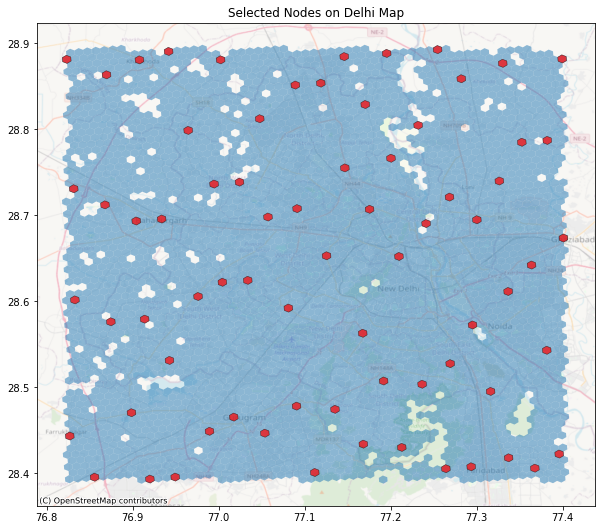

In [30]:
df_selected = delhi_region.loc[selected_nodes]

# Plot the Delhi map with basemap
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_aspect('equal')
delhi_region.plot(ax=ax, alpha=0.5)
df_selected.plot(ax=ax, color='red', alpha=0.7, edgecolor='black', linewidth=0.5)

# Add basemap
cx.add_basemap(ax, crs=delhi_region.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik, alpha=0.5)

plt.title('Selected Nodes on Delhi Map')
plt.show()

In [29]:
def calculate_average(node, G, delhi_region):
    neighbors = list(G.neighbors(node))
    if neighbors:
        a_values = []
        b_values = []

        for neighbor in neighbors:
            # Calculate a value
            a_values.append(delhi_region.at[neighbor, 'population'] * np.exp(-0.95**2))

            # Get neighbors of the neighbor (excluding the current node)
            second_neighbors = list(G.neighbors(neighbor))
            second_neighbors = [n for n in second_neighbors if n != node]

            for second_neighbor in second_neighbors:
                # Calculate b value
                b_values.append(delhi_region.at[second_neighbor, 'population'] * np.exp(-1.9**2))

        # Calculate average for a and b
        average_a = np.mean(a_values)
        average_b = np.mean(b_values)

        # Calculate the final average
        final_average = (average_a) + (average_b)

        return final_average
    else:
        return None

# Calculate average for each node in the graph
average_values = {}
for node in G.nodes:
    average = calculate_average(node, G, delhi_region)
    if average is not None:
        average_values[node] = average

# Print or use the average values as needed
for node, average in average_values.items():
    print(f"Node {node}: Average = {average:.2f}")

Node 1534419: Average = 247.39
Node 1534420: Average = 27.46
Node 1534421: Average = 116.57
Node 1534422: Average = 150.34
Node 1534423: Average = 49.03
Node 1534424: Average = 58.26
Node 1534432: Average = 99.05
Node 1534433: Average = 483.04
Node 1534434: Average = 99.99
Node 1534435: Average = 326.58
Node 1534436: Average = 331.22
Node 1534437: Average = 280.80
Node 1534438: Average = 509.39
Node 1534857: Average = 155.62
Node 1534858: Average = 311.17
Node 1534863: Average = 226.52
Node 1534864: Average = 335.61
Node 1534865: Average = 224.93
Node 1534866: Average = 567.28
Node 1534867: Average = 305.21
Node 1534868: Average = 500.69
Node 1534869: Average = 408.59
Node 1534870: Average = 275.35
Node 1534871: Average = 181.09
Node 1534872: Average = 231.41
Node 1534873: Average = 210.87
Node 1534874: Average = 244.46
Node 1534875: Average = 207.67
Node 1534876: Average = 119.62
Node 1534878: Average = 1012.21
Node 1534879: Average = 506.13
Node 1534891: Average = 543.46
Node 1534892

Node 1547913: Average = 1177.43
Node 1547914: Average = 2103.64
Node 1547915: Average = 2426.48
Node 1547916: Average = 3950.38
Node 1547917: Average = 1822.05
Node 1547918: Average = 2744.96
Node 1547919: Average = 294.04
Node 1547920: Average = 185.30
Node 1547921: Average = 213.16
Node 1547922: Average = 114.76
Node 1547923: Average = 151.02
Node 1547924: Average = 168.04
Node 1547925: Average = 203.45
Node 1547926: Average = 924.50
Node 1547927: Average = 1031.54
Node 1547928: Average = 174.11
Node 1547929: Average = 959.39
Node 1547930: Average = 226.87
Node 1547931: Average = 816.80
Node 1547932: Average = 645.99
Node 1547933: Average = 511.43
Node 1547935: Average = 825.10
Node 1547936: Average = 1786.68
Node 1547937: Average = 1178.59
Node 1547938: Average = 1475.77
Node 1547939: Average = 1111.65
Node 1547940: Average = 1712.23
Node 1547941: Average = 869.76
Node 1547942: Average = 1432.17
Node 1547943: Average = 129.71
Node 1547945: Average = 169.22
Node 1547948: Average = 23

In [30]:
sorted_nodes = sorted(average_values, key=average_values.get, reverse=True)

# Select top 250 nodes such that no node is within a 3km radius of any other node
selected_nodes = []
for node in sorted_nodes:
    coordinates_node = delhi_region.at[node, 'geometry'].centroid.coords[0]
    is_valid = all(geodesic(coordinates_node, delhi_region.at[selected_node, 'geometry'].centroid.coords[0]).km >= 1.5
                   for selected_node in selected_nodes)
    if is_valid:
        selected_nodes.append(node)
    if len(selected_nodes) == 250:
        break

# Print or use the selected nodes as needed
print("Selected Nodes:", selected_nodes)

Selected Nodes: [1536262, 1536265, 1537335, 1547270, 1547467, 1539447, 1537359, 1547654, 1547300, 1547587, 1548906, 1548597, 1547484, 1547309, 1547470, 1539490, 1539421, 1539467, 1547577, 1539331, 1537338, 1547278, 1547447, 1539318, 1539470, 1547630, 1539319, 1547611, 1548706, 1536289, 1539400, 1539405, 1547443, 1537353, 1536318, 1539444, 1547308, 1537537, 1548914, 1549082, 1548495, 1548693, 1548903, 1536397, 1548893, 1548509, 1547984, 1536131, 1539663, 1547977, 1547244, 1547331, 1536312, 1547624, 1547629, 1537550, 1536250, 1547600, 1536242, 1547876, 1536360, 1537635, 1548948, 1539411, 1547412, 1547978, 1548501, 1548947, 1536144, 1537424, 1539279, 1547594, 1548725, 1547419, 1536101, 1537626, 1540122, 1548559, 1540025, 1548614, 1547375, 1548615, 1546981, 1548859, 1539362, 1539168, 1548953, 1547916, 1539660, 1540001, 1548560, 1549116, 1546987, 1548584, 1548868, 1547805, 1539727, 1546909, 1536123, 1539164, 1547711, 1546921, 1539963, 1546912, 1548811, 1546929, 1548938, 1547336, 1547828, 15

In [31]:
len(selected_nodes)

250

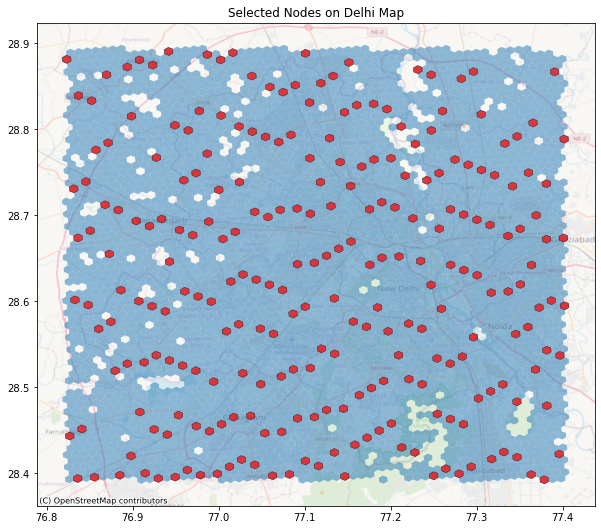

In [32]:
df_selected = delhi_region.loc[selected_nodes]

# Plot the Delhi map with basemap
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_aspect('equal')
delhi_region.plot(ax=ax, alpha=0.5)
df_selected.plot(ax=ax, color='red', alpha=0.7, edgecolor='black', linewidth=0.5)

# Add basemap
cx.add_basemap(ax, crs=delhi_region.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik, alpha=0.5)

plt.title('Selected Nodes on Delhi Map')
plt.show()

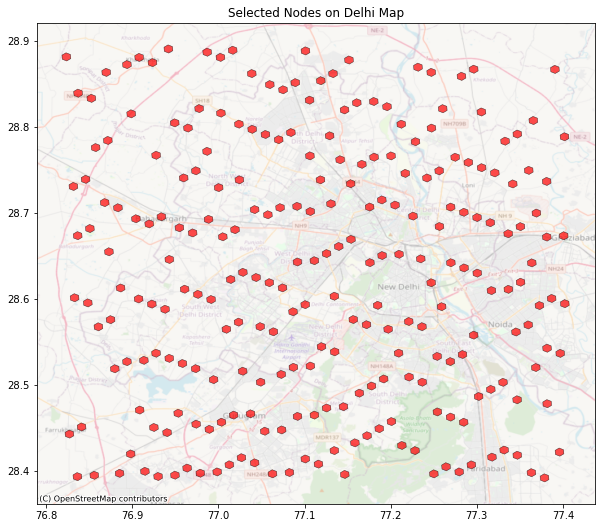

In [35]:
df_selected = delhi_region.loc[selected_nodes]

# Plot the Delhi map with basemap
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_aspect('equal')
df_selected.plot(ax=ax, color='red', alpha=0.7, edgecolor='black', linewidth=0.5)

# Add basemap
cx.add_basemap(ax, crs=delhi_region.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik, alpha=0.5)

plt.title('Selected Nodes on Delhi Map')
plt.show()

In [33]:
!pip install itertools


ERROR: Could not find a version that satisfies the requirement itertools (from versions: none)
ERROR: No matching distribution found for itertools


In [34]:
import itertools  

In [35]:
len(df_selected)

250

In [39]:
# calculating Cij, Tij and dij
def calculate_criteria2(station_i, station_j, lamda):
    dij = calculate_distance(station_i,station_j)

    Pi = station_i['population']
    Pj = station_j['population']

    Cij = lamda * dij/(Pi + Pj)
    Tij = lamda * dij

    return Cij, Tij, dij

In [42]:
# calculating Cij, Tij and dij
def calculate_criteria3(station_i, station_j, lamda):
    dij = calculate_distance(station_i,station_j)

    Pi = station_i['population']
    Pj = station_j['population']

    Cij = lamda * dij
    Tij = lamda * dij

    return Cij, Tij, dij

In [102]:
import networkx as nx
import geopandas as gpd
from geopy.distance import geodesic
import numpy as np

# Assuming df_selected is your GeoDataFrame of selected metro stations

# Function to calculate distance between two nodes
def calculate_distance(node1, node2):
    return geodesic(node1['geometry'].centroid.coords[0], node2['geometry'].centroid.coords[0]).km

# Create a graph
G = nx.Graph()

# Add nodes to the graph
for node in df_selected.index:
    G.add_node(node, pos=df_selected.at[node, 'geometry'].centroid.coords[0])

# Connect each node to its 5 nearest neighbors
nearest_15_mapping = {}  # Dictionary to store mapping of each node to its 15 nearest nodes with distances

for i in df_selected.index:
    distances = [(j, calculate_distance(df_selected.loc[i], df_selected.loc[j])) for j in df_selected.index if i != j]
    
    # Sort distances based on both distance and node name to ensure consistent sorting
    sorted_distances = sorted(distances, key=lambda x: (x[1], x[0]))
    
    # Take the first 15 nodes
    nearest_15 = sorted_distances[:15]
    
    # Add edges to the graph
    G.add_edges_from([(i, node) for node, _ in nearest_15])
    
    # Update the dictionary with the mapping of nearest nodes and distances
    nearest_15_mapping[i] = [(node, distance) for node, distance in nearest_15]

# Print the mapping
for node, nearest_nodes in nearest_15_mapping.items():
    print(f"{node}: {nearest_nodes}")

# Convert the dictionary to a NumPy array if needed
nearest_15_array = np.array(list(nearest_15_mapping.values()))
print(nearest_15_array)


1536262: [(1536397, 1.5392403061267081), (1547270, 1.557110157457174), (1547443, 1.589580612697088), (1536265, 1.7186090827597928), (1536250, 1.810955282481921), (1547467, 2.457613425427734), (1536242, 2.62869188953494), (1536152, 2.995480850221013), (1547336, 3.0764707812202294), (1536318, 3.180890089171734), (1547494, 3.323039177143402), (1536388, 3.359528573702951), (1537335, 3.436838949620583), (1547470, 3.930019939376966), (1536155, 3.9895732531124954)]
1536265: [(1536242, 1.5380989592841925), (1547467, 1.5875382359462102), (1537335, 1.7182298793052806), (1536262, 1.7186090827597928), (1536397, 1.9331583668662118), (1547443, 2.2155502398277847), (1547470, 2.454646673494513), (1536360, 2.6288017898401943), (1547270, 3.1931362026261825), (1536250, 3.409491208516675), (1537359, 3.4360804149027753), (1536172, 3.655357832760626), (1548501, 3.729820344684328), (1536155, 3.8936703600481595), (1547336, 3.9452275880108334)]
1537335: [(1536360, 1.5369603658759323), (1547470, 1.5854979925266

In [215]:
def calculate_bfs_distance2(graph, start_node, target_nodes):
    # Perform BFS traversal
    shortest_distances = nx.single_source_shortest_path_length(graph, source=start_node)
    
    # Filter distances for target nodes
    return shortest_distances[target_nodes]

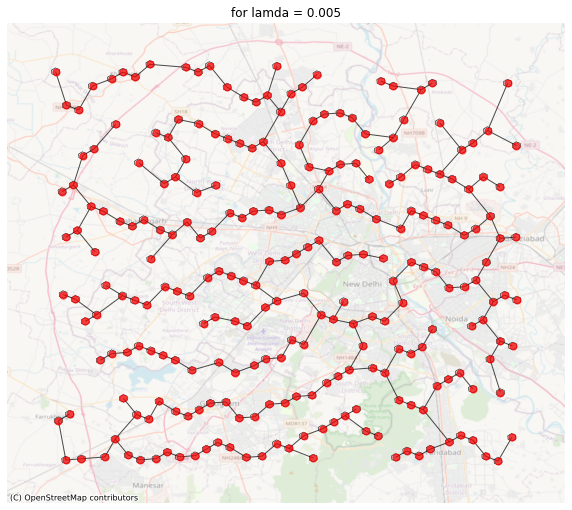

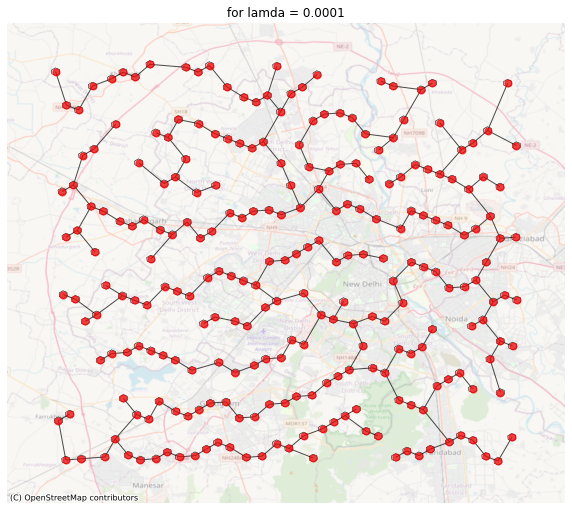

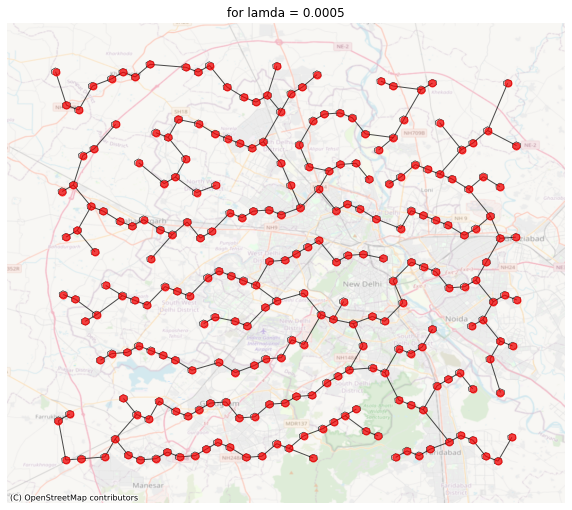

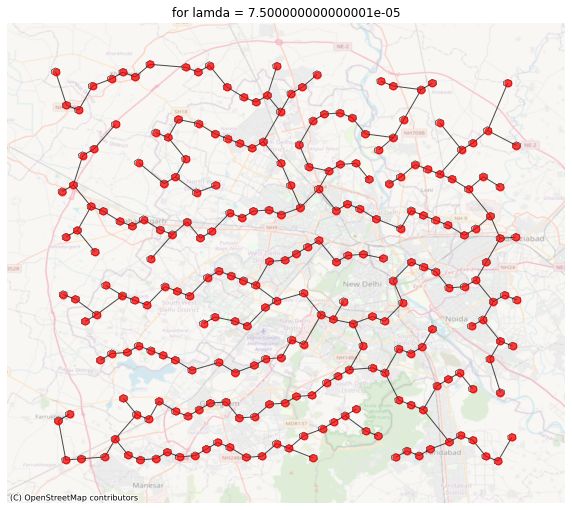

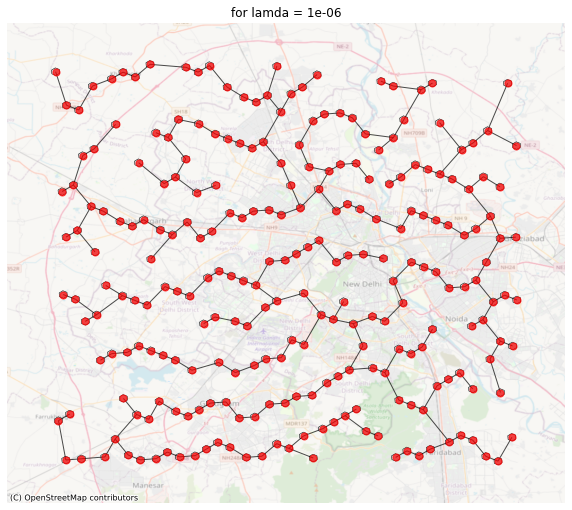

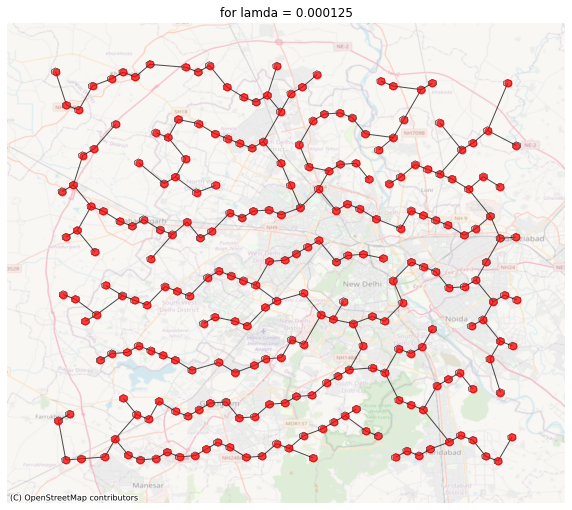

In [235]:
import networkx as nx
import geopandas as gpd
from geopy.distance import geodesic

# Function to calculate distance between two nodes

# Assuming df_selected is your GeoDataFrame of selected metro stations

# Create a graph
start_node = random.choice(df_selected.index)
GG = nx.Graph()
GG.add_node(start_node, pos=df_selected.at[start_node, 'geometry'].centroid.coords[0])

# Add nodes to the grap
# Function to calculate Cij
def calculate_Cij(node1, node2):
    distances = calculate_bfs_distance2(G,node1, node2)
    return distances 

# Function to calculate Tij
def calculate_Tij(node1, node2):
    distances = calculate_bfs_distance2(G,node1, node2)*(df_selected.loc[node1]['population'] + df_selected.loc[node2]['population']) / 2
    return distances

# Function to calculate Fij
def calculate_Fij(node1, node2,lamda_c,lamda_t):
    Cij = calculate_Cij(node1, node2)
    Tij = calculate_Tij(node1, node2)
    #print(Cij,Tij)
    return (lamda_c / Cij) + (lamda_t / Tij)

# Function to calculate Vij
def calculate_Vij(distance, sum_distances, Fij):
    return (1 - distance / sum_distances)**2 * Fij

def calculate_bfs_distance(graph, start_node, target_nodes):
    # Perform BFS traversal
    shortest_distances = nx.single_source_shortest_path_length(graph, source=start_node)
    
    # Filter distances for target nodes
    distances = {node: shortest_distances[node] for node in target_nodes}
    
    return distances

lam = [5*1e-3,1e-4,5*1e-4,7.5*1e-5,1e-6,1.25*1e-4]

for lamda_t in lam:

    # Iterate until all nodes are connected
    while len(df_selected) - len(GG.nodes):
        # Iterate over all nodes in the network
        max_Vij = 0
        best_i = None
        best_j = None
        for j_node in GG.nodes:
            # Find at most 5 nearest nodes of j that are not part of the network
            target_nodes = [node for node in df_selected.index if node not in GG.nodes]
            distances = calculate_bfs_distance(G, j_node, target_nodes)
            closest_nodes = sorted(distances, key=distances.get)[:5]

            # Calculate sum of distances for Vij calculation
            total_sum = 0
            for i in closest_nodes:
                total_sum += distances[i]

            # Connect the node i to j based on highest Vij
            for i_node in closest_nodes:
                distance = distances[i_node]
                Fij = calculate_Fij(j_node, i_node,1,lamda_t)
                Vij = calculate_Vij(distance, total_sum, Fij)

                if Vij >= max_Vij:
                    max_Vij = Vij
                    best_i = i_node
                    best_j = j_node


        # Add the edge to the graph
        if(best_i == None):
            break
        GG.add_edge(best_i, best_j)

    # Now, G should be your connected network
    # Plot the resulting graph
    fig, ax = plt.subplots(figsize=(10, 10))
    
    df_selected.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)
    nx.draw(GG, pos=nx.get_node_attributes(G, 'pos'), with_labels=False, node_size=50, node_color='red', alpha=0.7)
    cx.add_basemap(ax, crs=df_selected.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik, alpha=0.5)
    plt.title(f'for lamda = {lamda_t}')
    
    plt.show()


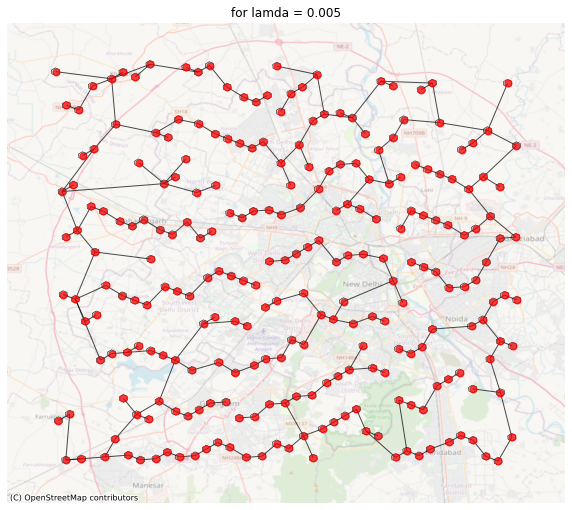

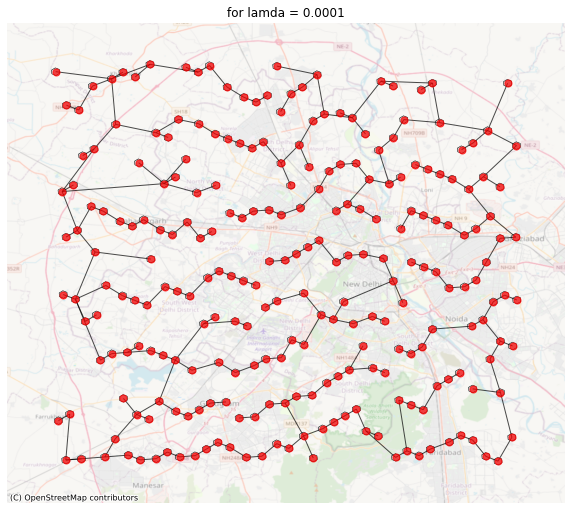

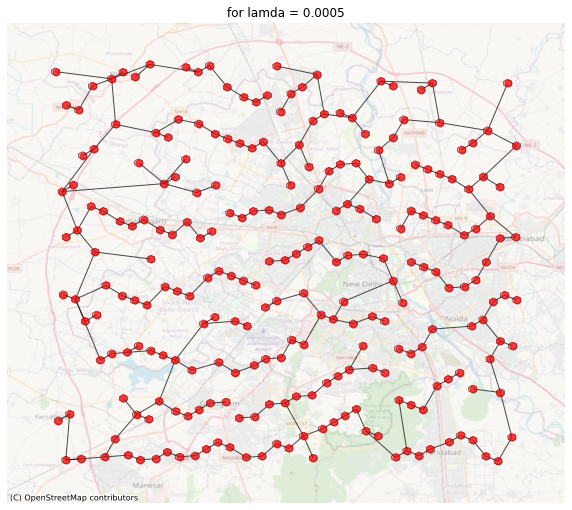

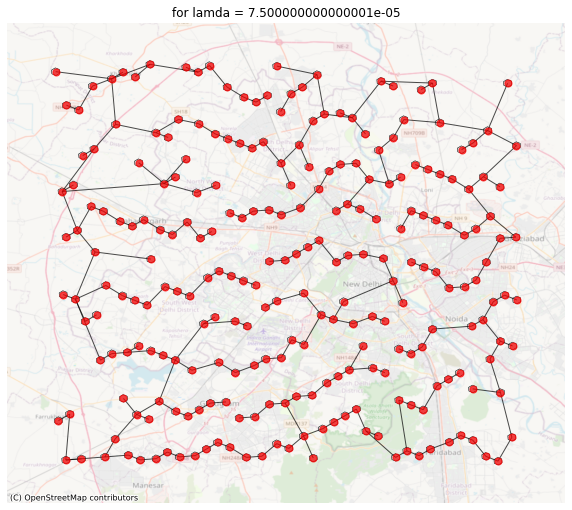

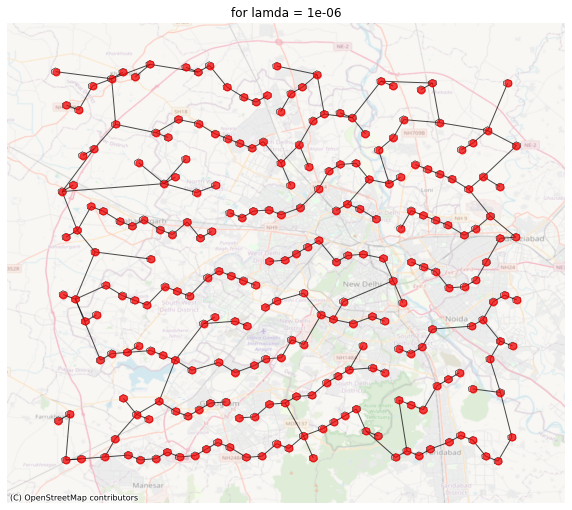

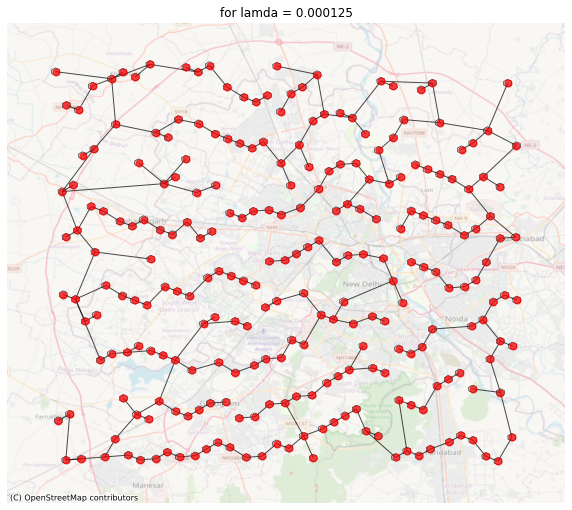

In [236]:
import networkx as nx
import geopandas as gpd
from geopy.distance import geodesic

# Function to calculate distance between two nodes

# Assuming df_selected is your GeoDataFrame of selected metro stations

# Create a graph
start_node = random.choice(df_selected.index)
GG = nx.Graph()
GG.add_node(start_node, pos=df_selected.at[start_node, 'geometry'].centroid.coords[0])

# Add nodes to the grap
# Function to calculate Cij
def calculate_Cij(node1, node2):
    distances = calculate_bfs_distance2(G,node1, node2)
    return distances 

# Function to calculate Tij
def calculate_Tij(node1, node2):
    distances = calculate_bfs_distance2(G,node1, node2)*(df_selected.loc[node1]['population'] + df_selected.loc[node2]['population']) / 2
    return distances

# Function to calculate Fij
def calculate_Fij(node1, node2,lamda_c,lamda_t):
    Cij = calculate_Cij(node1, node2)
    Tij = calculate_Tij(node1, node2)
    #print(Cij,Tij)
    return (lamda_c / Cij)*(lamda_t / Tij)

# Function to calculate Vij
def calculate_Vij(distance, sum_distances, Fij):
    return (1 - distance / sum_distances)**2 * Fij

def calculate_bfs_distance(graph, start_node, target_nodes):
    # Perform BFS traversal
    shortest_distances = nx.single_source_shortest_path_length(graph, source=start_node)
    
    # Filter distances for target nodes
    distances = {node: shortest_distances[node] for node in target_nodes}
    
    return distances

lam = [5*1e-3,1e-4,5*1e-4,7.5*1e-5,1e-6,1.25*1e-4]

for lamda_t in lam:

    # Iterate until all nodes are connected
    while len(df_selected) - len(GG.nodes):
        # Iterate over all nodes in the network
        max_Vij = 0
        best_i = None
        best_j = None
        for j_node in GG.nodes:
            # Find at most 5 nearest nodes of j that are not part of the network
            target_nodes = [node for node in df_selected.index if node not in GG.nodes]
            distances = calculate_bfs_distance(G, j_node, target_nodes)
            closest_nodes = sorted(distances, key=distances.get)[:5]

            # Calculate sum of distances for Vij calculation
            total_sum = 0
            for i in closest_nodes:
                total_sum += distances[i]

            # Connect the node i to j based on highest Vij
            for i_node in closest_nodes:
                distance = distances[i_node]
                Fij = calculate_Fij(j_node, i_node,1,lamda_t)
                Vij = calculate_Vij(distance, total_sum, Fij)

                if Vij >= max_Vij:
                    max_Vij = Vij
                    best_i = i_node
                    best_j = j_node


        # Add the edge to the graph
        if(best_i == None):
            break
        GG.add_edge(best_i, best_j)

    # Now, G should be your connected network
    # Plot the resulting graph
    fig, ax = plt.subplots(figsize=(10, 10))
    
    df_selected.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)
    nx.draw(GG, pos=nx.get_node_attributes(G, 'pos'), with_labels=False, node_size=50, node_color='red', alpha=0.7)
    cx.add_basemap(ax, crs=df_selected.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik, alpha=0.5)
    plt.title(f'for lamda = {lamda_t}')
    
    plt.show()


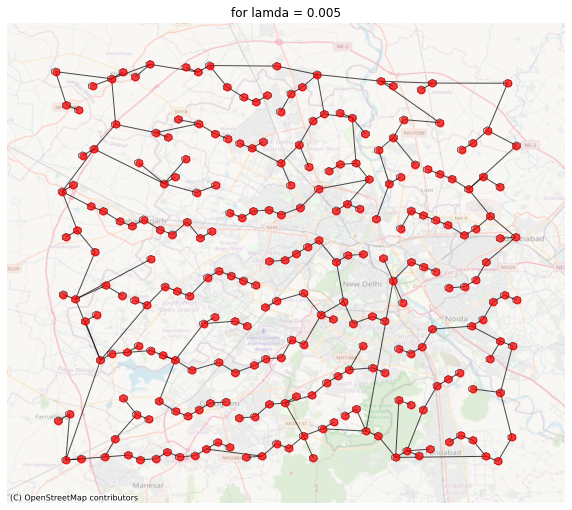

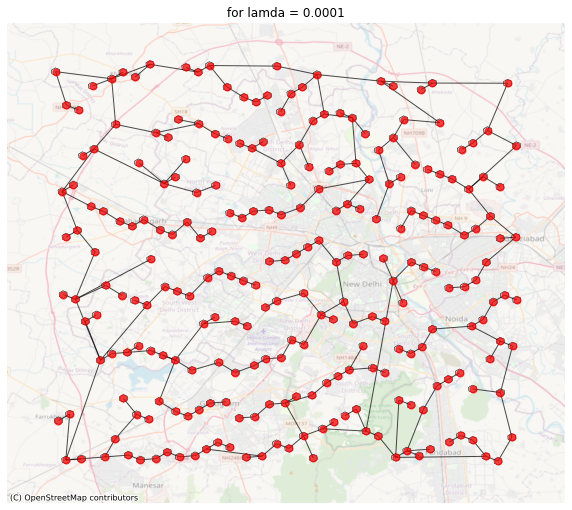

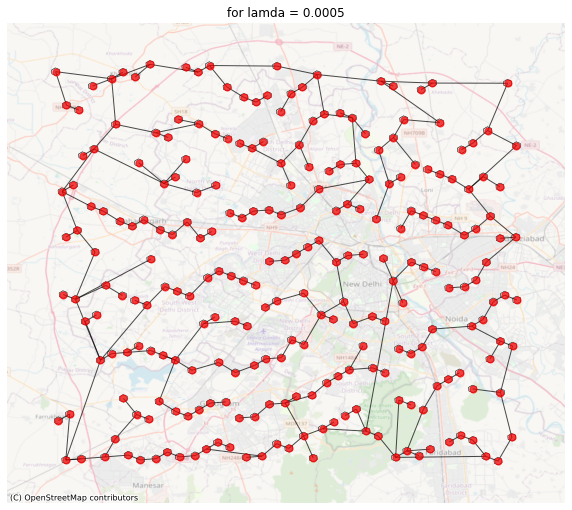

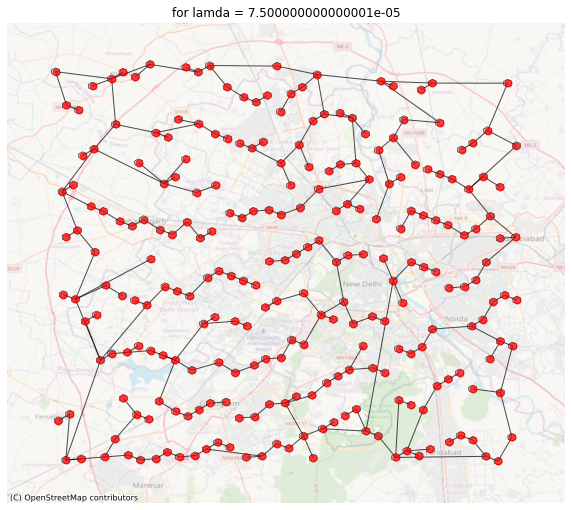

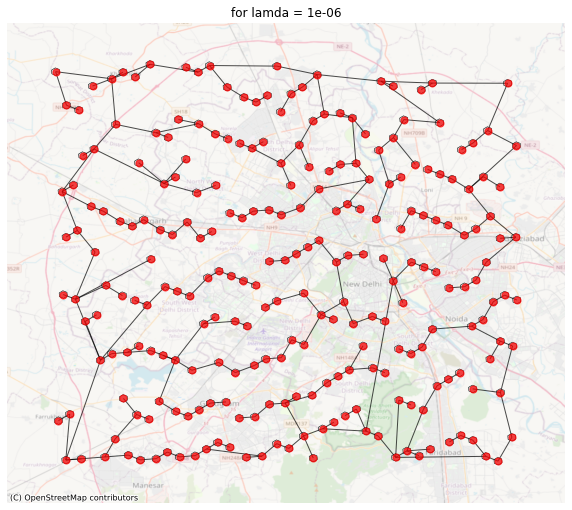

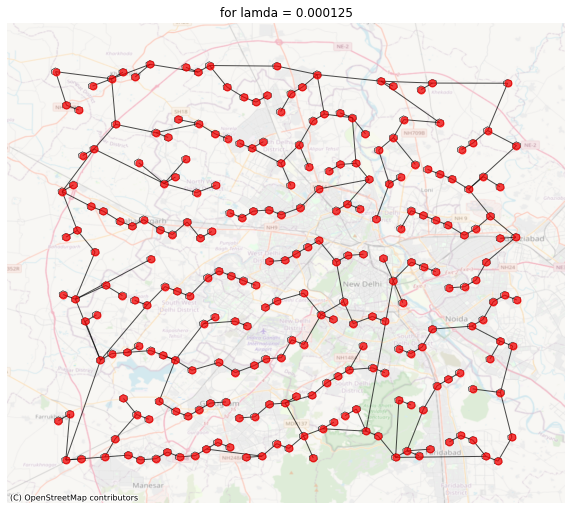

In [237]:
import networkx as nx
import geopandas as gpd
from geopy.distance import geodesic

# Function to calculate distance between two nodes

# Assuming df_selected is your GeoDataFrame of selected metro stations

# Create a graph
start_node = random.choice(df_selected.index)
GG = nx.Graph()
GG.add_node(start_node, pos=df_selected.at[start_node, 'geometry'].centroid.coords[0])

# Add nodes to the grap
# Function to calculate Cij
def calculate_Cij(node1, node2):
    distances = calculate_bfs_distance2(G,node1, node2)
    return distances 

# Function to calculate Tij
def calculate_Tij(node1, node2):
    distances = (df_selected.loc[node1]['population'] + df_selected.loc[node2]['population']) / 2
    return distances

# Function to calculate Fij
def calculate_Fij(node1, node2,lamda_c,lamda_t):
    Cij = calculate_Cij(node1, node2)
    Tij = calculate_Tij(node1, node2)
    #print(Cij,Tij)
    return (lamda_c / Cij)*(lamda_t / Tij)

# Function to calculate Vij
def calculate_Vij(distance, sum_distances, Fij):
    return (1 - distance / sum_distances)**2 * Fij

def calculate_bfs_distance(graph, start_node, target_nodes):
    # Perform BFS traversal
    shortest_distances = nx.single_source_shortest_path_length(graph, source=start_node)
    
    # Filter distances for target nodes
    distances = {node: shortest_distances[node] for node in target_nodes}
    
    return distances

lam = [5*1e-3,1e-4,5*1e-4,7.5*1e-5,1e-6,1.25*1e-4]

for lamda_t in lam:

    # Iterate until all nodes are connected
    while len(df_selected) - len(GG.nodes):
        # Iterate over all nodes in the network
        max_Vij = 0
        best_i = None
        best_j = None
        for j_node in GG.nodes:
            # Find at most 5 nearest nodes of j that are not part of the network
            target_nodes = [node for node in df_selected.index if node not in GG.nodes]
            distances = calculate_bfs_distance(G, j_node, target_nodes)
            closest_nodes = sorted(distances, key=distances.get)[:5]

            # Calculate sum of distances for Vij calculation
            total_sum = 0
            for i in closest_nodes:
                total_sum += distances[i]

            # Connect the node i to j based on highest Vij
            for i_node in closest_nodes:
                distance = distances[i_node]
                Fij = calculate_Fij(j_node, i_node,1,lamda_t)
                Vij = calculate_Vij(distance, total_sum, Fij)

                if Vij >= max_Vij:
                    max_Vij = Vij
                    best_i = i_node
                    best_j = j_node


        # Add the edge to the graph
        if(best_i == None):
            break
        GG.add_edge(best_i, best_j)

    # Now, G should be your connected network
    # Plot the resulting graph
    fig, ax = plt.subplots(figsize=(10, 10))
    
    df_selected.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)
    nx.draw(GG, pos=nx.get_node_attributes(G, 'pos'), with_labels=False, node_size=50, node_color='red', alpha=0.7)
    cx.add_basemap(ax, crs=df_selected.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik, alpha=0.5)
    plt.title(f'for lamda = {lamda_t}')
    
    plt.show()


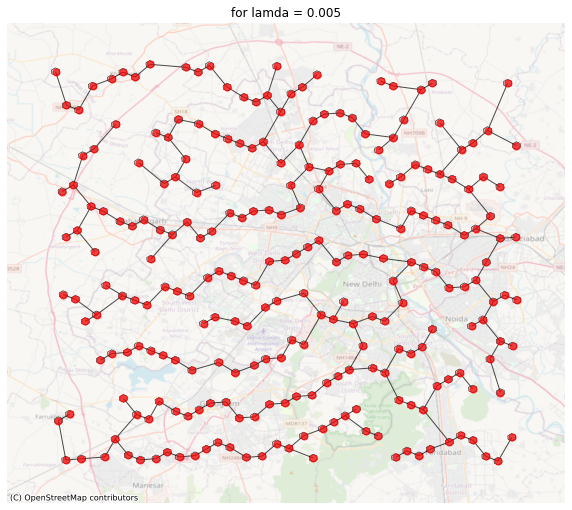

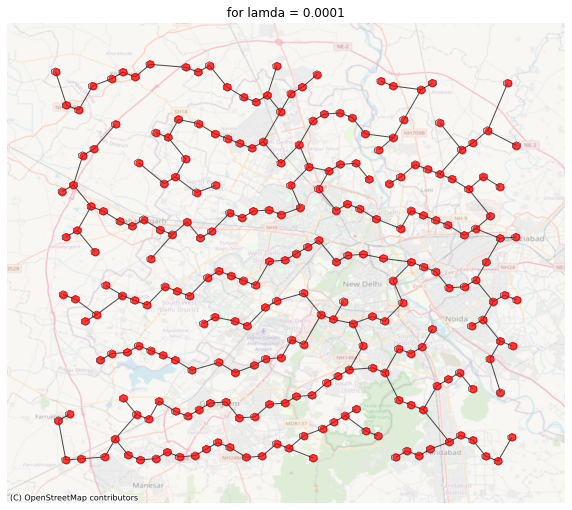

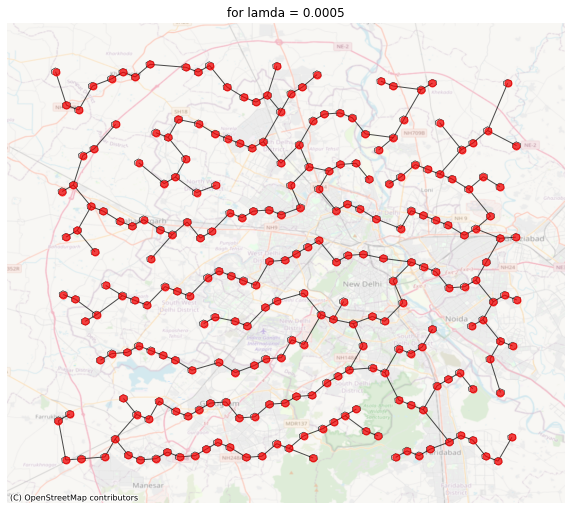

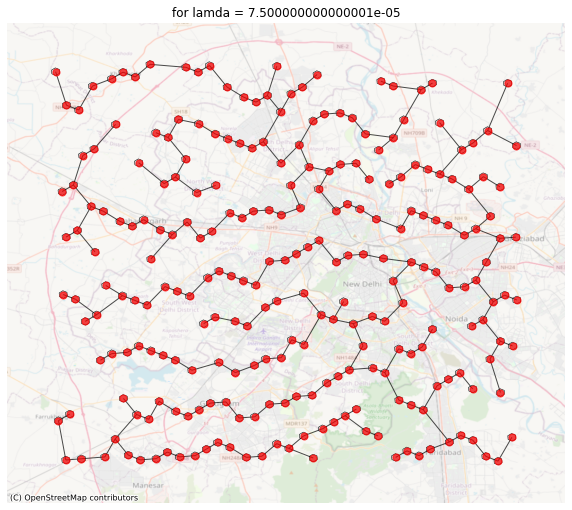

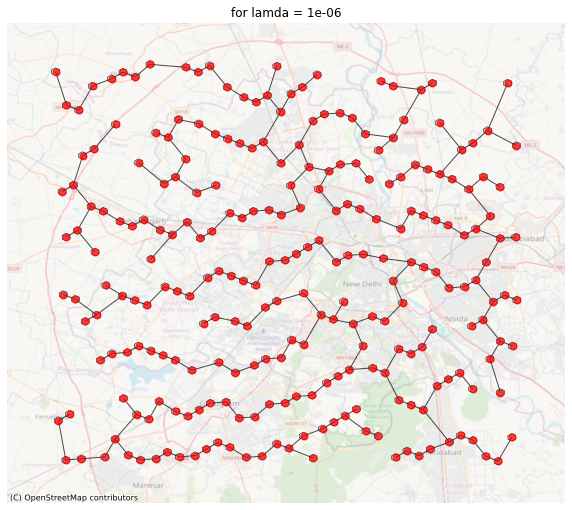

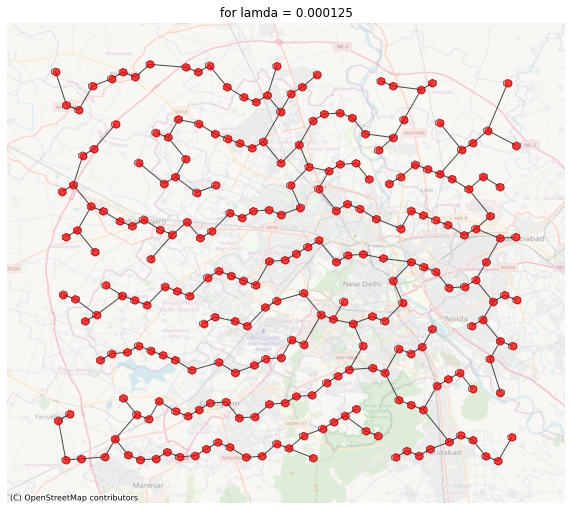

In [238]:
import networkx as nx
import geopandas as gpd
from geopy.distance import geodesic

# Function to calculate distance between two nodes

# Assuming df_selected is your GeoDataFrame of selected metro stations

# Create a graph
start_node = random.choice(df_selected.index)
GG = nx.Graph()
GG.add_node(start_node, pos=df_selected.at[start_node, 'geometry'].centroid.coords[0])

# Add nodes to the grap
# Function to calculate Cij
def calculate_Cij(node1, node2):
    distances = calculate_bfs_distance2(G,node1, node2)
    return distances 

# Function to calculate Tij
def calculate_Tij(node1, node2):
    distances = (df_selected.loc[node1]['population'] + df_selected.loc[node2]['population']) / 2
    return distances

# Function to calculate Fij
def calculate_Fij(node1, node2,lamda_c,lamda_t):
    Cij = calculate_Cij(node1, node2)
    Tij = calculate_Tij(node1, node2)
    #print(Cij,Tij)
    return (lamda_c / Cij) + (lamda_t / Tij)

# Function to calculate Vij
def calculate_Vij(distance, sum_distances, Fij):
    return (1 - distance / sum_distances)**2 * Fij

def calculate_bfs_distance(graph, start_node, target_nodes):
    # Perform BFS traversal
    shortest_distances = nx.single_source_shortest_path_length(graph, source=start_node)
    
    # Filter distances for target nodes
    distances = {node: shortest_distances[node] for node in target_nodes}
    
    return distances

lam = [5*1e-3,1e-4,5*1e-4,7.5*1e-5,1e-6,1.25*1e-4]

for lamda_t in lam:

    # Iterate until all nodes are connected
    while len(df_selected) - len(GG.nodes):
        # Iterate over all nodes in the network
        max_Vij = 0
        best_i = None
        best_j = None
        for j_node in GG.nodes:
            # Find at most 5 nearest nodes of j that are not part of the network
            target_nodes = [node for node in df_selected.index if node not in GG.nodes]
            distances = calculate_bfs_distance(G, j_node, target_nodes)
            closest_nodes = sorted(distances, key=distances.get)[:5]

            # Calculate sum of distances for Vij calculation
            total_sum = 0
            for i in closest_nodes:
                total_sum += distances[i]

            # Connect the node i to j based on highest Vij
            for i_node in closest_nodes:
                distance = distances[i_node]
                Fij = calculate_Fij(j_node, i_node,1,lamda_t)
                Vij = calculate_Vij(distance, total_sum, Fij)

                if Vij >= max_Vij:
                    max_Vij = Vij
                    best_i = i_node
                    best_j = j_node


        # Add the edge to the graph
        if(best_i == None):
            break
        GG.add_edge(best_i, best_j)

    # Now, G should be your connected network
    # Plot the resulting graph
    fig, ax = plt.subplots(figsize=(10, 10))
    
    df_selected.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)
    nx.draw(GG, pos=nx.get_node_attributes(G, 'pos'), with_labels=False, node_size=50, node_color='red', alpha=0.7)
    cx.add_basemap(ax, crs=df_selected.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik, alpha=0.5)
    plt.title(f'for lamda = {lamda_t}')
    
    plt.show()


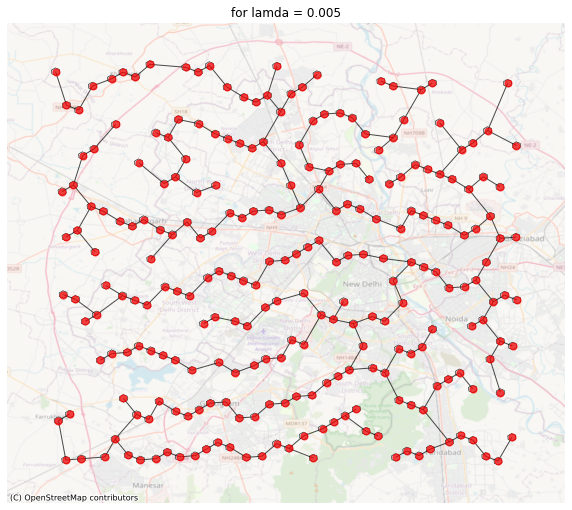

In [244]:
import networkx as nx
import geopandas as gpd
from geopy.distance import geodesic

# Function to calculate distance between two nodes

# Assuming df_selected is your GeoDataFrame of selected metro stations

# Create a graph
start_node = random.choice(df_selected.index)
GG = nx.Graph()
GG.add_node(start_node, pos=df_selected.at[start_node, 'geometry'].centroid.coords[0])

# Add nodes to the grap
# Function to calculate Cij
def calculate_Cij(node1, node2):
    distances = calculate_bfs_distance2(G,node1, node2)
    return distances 

# Function to calculate Tij
def calculate_Tij(node1, node2):
    distances = (df_selected.loc[node1]['population'] + df_selected.loc[node2]['population']) / 2
    return distances

# Function to calculate Fij
def calculate_Fij(node1, node2,lamda_c,lamda_t, lamda_add, lamda_multiply):
    Cij = calculate_Cij(node1, node2)
    Tij = calculate_Tij(node1, node2)
    #print(Cij,Tij)
    multi = lamda_multiply*(lamda_c / Cij)*(lamda_t / Tij)
    add = lamda_add*((lamda_c / Cij) + (lamda_t / Tij))
    return (lamda_c / Cij) + (lamda_t / Tij)

# Function to calculate Vij
def calculate_Vij(distance, sum_distances, Fij):
    return (1 - distance / sum_distances)**2 * Fij

def calculate_bfs_distance(graph, start_node, target_nodes):
    # Perform BFS traversal
    shortest_distances = nx.single_source_shortest_path_length(graph, source=start_node)
    
    # Filter distances for target nodes
    distances = {node: shortest_distances[node] for node in target_nodes}
    
    return distances

lam = [5*1e-3]

for lamda_t in lam:

    # Iterate until all nodes are connected
    while len(df_selected) - len(GG.nodes):
        # Iterate over all nodes in the network
        max_Vij = 0
        best_i = None
        best_j = None
        for j_node in GG.nodes:
            # Find at most 5 nearest nodes of j that are not part of the network
            target_nodes = [node for node in df_selected.index if node not in GG.nodes]
            distances = calculate_bfs_distance(G, j_node, target_nodes)
            closest_nodes = sorted(distances, key=distances.get)[:5]

            # Calculate sum of distances for Vij calculation
            total_sum = 0
            for i in closest_nodes:
                total_sum += distances[i]

            # Connect the node i to j based on highest Vij
            for i_node in closest_nodes:
                distance = distances[i_node]
                Fij = calculate_Fij(j_node, i_node,1,lamda_t,1,1)
                Vij = calculate_Vij(distance, total_sum, Fij)

                if Vij >= max_Vij:
                    max_Vij = Vij
                    best_i = i_node
                    best_j = j_node


        # Add the edge to the graph
        if(best_i == None):
            break
        GG.add_edge(best_i, best_j)

    # Now, G should be your connected network
    # Plot the resulting graph
    G_final = nx.Graph()
    G_final = GG.copy()
    
    fig, ax = plt.subplots(figsize=(10, 10))
    
    df_selected.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)
    nx.draw(GG, pos=nx.get_node_attributes(G, 'pos'), with_labels=False, node_size=50, node_color='red', alpha=0.7)
    cx.add_basemap(ax, crs=df_selected.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik, alpha=0.5)
    plt.title(f'for lamda = {lamda_t}')
    
    plt.show()


0
1
2
3
4
5
6
7
8
9


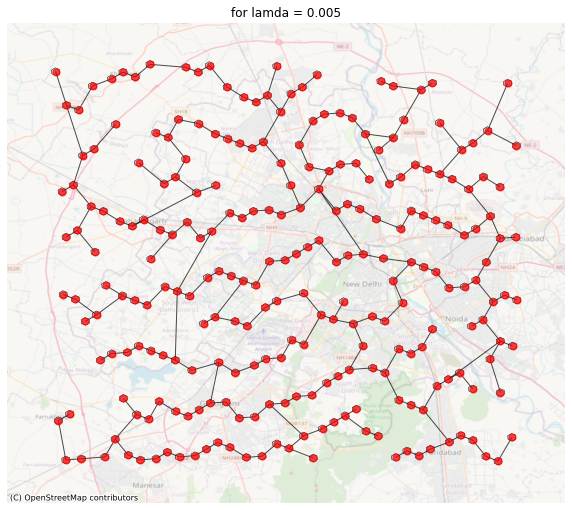

In [251]:
cnt = 0
G_final = nx.Graph()
G_final = GG.copy()
while(cnt<10):
    rand_node1 = random.choice(df_selected.index)
    rand_node2 = random.choice(df_selected.index)
    if(G_final.has_edge(rand_node1,rand_node2)):
        continue
    distance = calculate_bfs_distance2(G_final,rand_node1,rand_node2)
    distance_original = calculate_bfs_distance2(G,rand_node1,rand_node2)
    if(distance_original>12):
        continue
    if(distance>20):
        G_final.add_edge(rand_node1,rand_node2)
        print(cnt)
        cnt+=1
#unit??
fig, ax = plt.subplots(figsize=(10, 10))
    
df_selected.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)
nx.draw(G_final, pos=nx.get_node_attributes(G, 'pos'), with_labels=False, node_size=50, node_color='red', alpha=0.7)
cx.add_basemap(ax, crs=df_selected.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik, alpha=0.5)
plt.title(f'for lamda = {lamda_t}')
    
plt.show()
